# Visualizing Redlining Neighborhoods

## Mapping in Python
We start by importing a new module `geopandas`. This is a pretty high level geospatial library, widely used by spatial data scientists all over the world. Don't worry about it too much for now, but know that it allows us to import a variety of spatial data formats, and plot them on a map.

* [geopandas documentation](https://geopandas.readthedocs.io/en/latest/gallery/index.html)

## Finding spatial data

Spatial data comes in many forms. Most popular are:
- [Shapefiles](https://doc.arcgis.com/en/arcgis-online/reference/shapefiles.htm)
- [geojson](https://en.wikipedia.org/wiki/GeoJSON)
  - [geojson.io](https://geojson.io/)
- csv files with latitude longitude columns

## Using geopandas

1. `import` geopandas and give it an alias `gpd`
1. use `read_file` to bring spatial data to your notebook
1. use `plot` to visualize

In [1]:
# import geopandas
import geopandas as gpd

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


## Loading data

<img src="https://oehha.ca.gov/sites/default/files/media/files/images/logo/calenviroscreenlogosmaller.png">

Let's find some data to bring in.

- https://oehha.ca.gov/calenviroscreen
- [About the data](https://oehha.ca.gov/calenviroscreen/maps-data/download-data)

In [2]:
# load spatial data into a variable "cal"
cal = gpd.read_file('data/calenviroscreen40shpf2021shp.zip')

Once the data is loaded, you can visualize it: `.plot`

<AxesSubplot:>

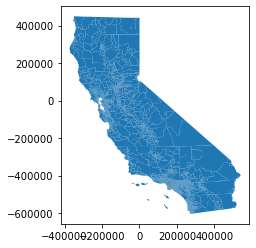

In [3]:
cal.plot()

Let's make the map bigger by adding an argument: `figsize`

<AxesSubplot:>

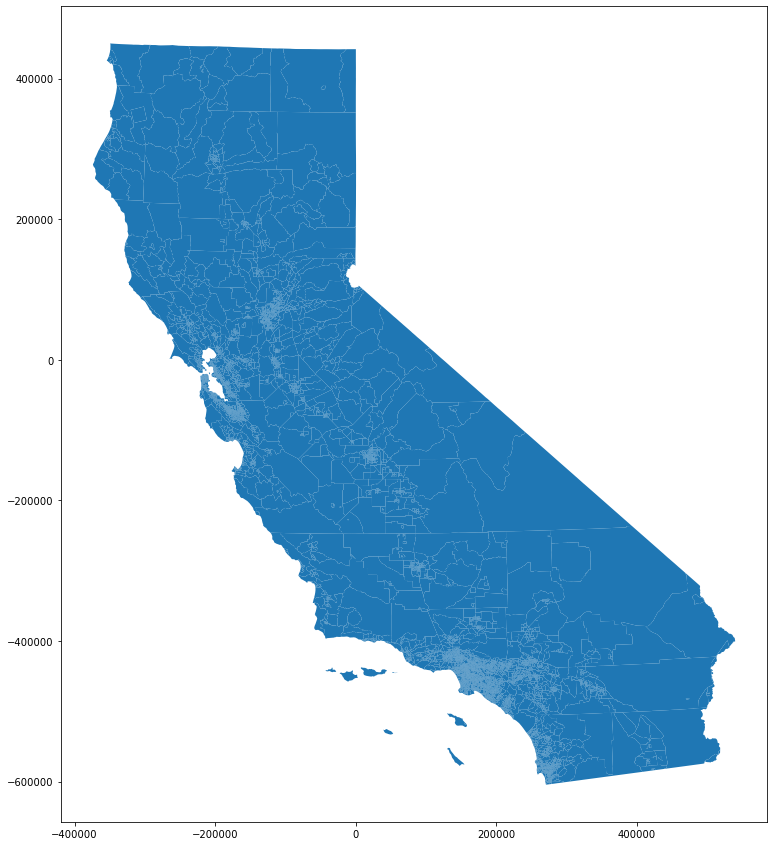

In [4]:
cal.plot(figsize=(15,15))

## Data view

Map layers (shapefiles, geojson files, etc) come with "attribute" data. You can look at the data through pandas commands.

First, look at the data fields available: `.info`

In [5]:
cal.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 8035 entries, 0 to 8034
Data columns (total 67 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Tract       8035 non-null   float64 
 1   ZIP         8035 non-null   int64   
 2   County      8035 non-null   object  
 3   ApproxLoc   8035 non-null   object  
 4   TotPop19    8035 non-null   int64   
 5   CIscore     8035 non-null   float64 
 6   CIscoreP    8035 non-null   float64 
 7   Ozone       8035 non-null   float64 
 8   OzoneP      8035 non-null   float64 
 9   PM2_5       8035 non-null   float64 
 10  PM2_5_P     8035 non-null   float64 
 11  DieselPM    8035 non-null   float64 
 12  DieselPM_P  8035 non-null   float64 
 13  Pesticide   8035 non-null   float64 
 14  PesticideP  8035 non-null   float64 
 15  Tox_Rel     8035 non-null   float64 
 16  Tox_Rel_P   8035 non-null   float64 
 17  Traffic     8035 non-null   float64 
 18  TrafficP    8035 non-null   float64 
 19

In [6]:
# look at the first 5 rows using .head


In [7]:
# look at the last 5 rows using .tail


In [8]:
# look at a single random record using .sample


In [9]:
# plot a single random census tract (hint: chain multiple commands!)


## Choropleth maps

Otherwise known as *thematic* maps, choropleth maps are a way to visualize *polygonial* data with colors. In other words, each region is colored a certain way, based on some criteria you define.

- [geopandas examples](https://geopandas.org/en/stable/gallery/choropleths.html)

Using the `.plot` function, we can add *arguments* to make it a choropleth map.
- `column` defines which attribute you want to use to color the map
- `scheme` defines how you want the colors to be distributed
  - `quantiles`
  - `NaturalBreaks`
  - `UserDefined`
- `legend` true or false
- `cmap` choose a [color scheme](https://matplotlib.org/stable/tutorials/colors/colormaps.html)
- `k` how many bins?

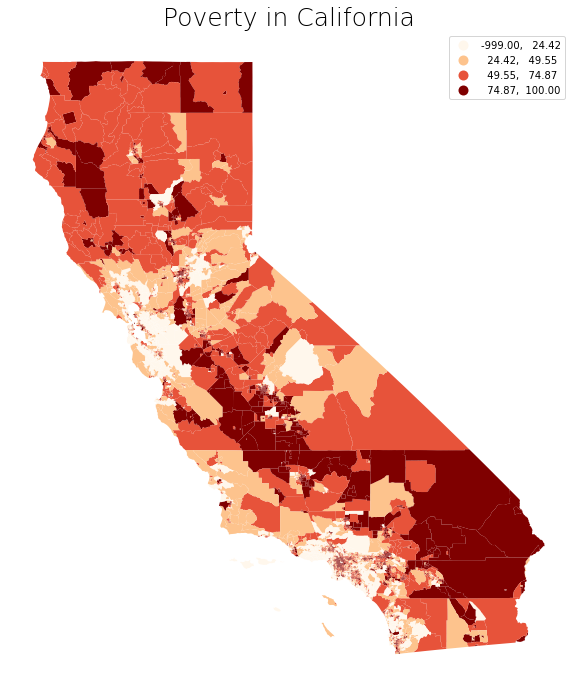

In [53]:
layer1 = cal.plot(figsize=(12,12),
                  column='PovertyP', 
                  scheme='quantiles', 
                  legend=True, 
                  cmap='OrRd',
                  k=4)

# give it a title
layer1.set_title('Poverty in California', fontdict={'fontsize': '25', 'fontweight' : '3'})

# turn the axes off
layer1.set_axis_off();

In the code cell that created the map above, what happens when you do the following?
- change the `k` value to 2
- change the `column` value to a different attribute
- change the `cmap` value to a different [color scheme](https://matplotlib.org/stable/tutorials/colors/colormaps.html)

### User defined bins

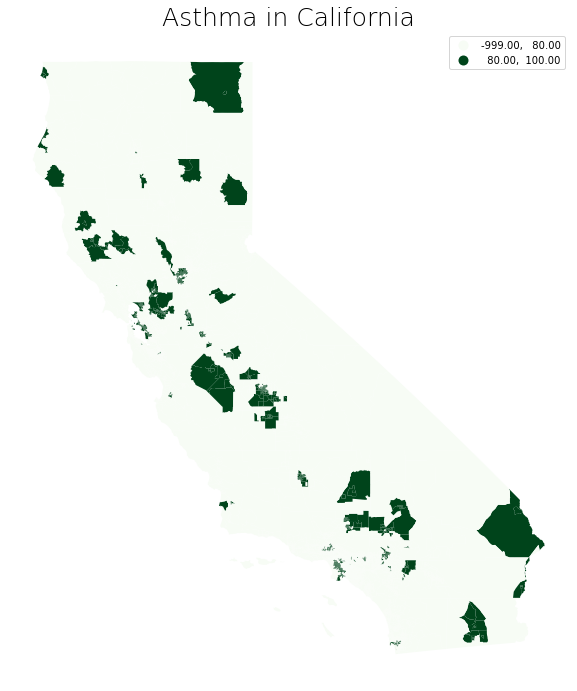

In [56]:
layer1 = cal.plot(figsize=(12,12),
                  column='AsthmaP', 
                  legend=True, 
                  cmap='Greens', 
                  scheme='user_defined', 
                  classification_kwds={'bins':[80,100]})

# give it a title
layer1.set_title('Asthma in California', fontdict={'fontsize': '25', 'fontweight' : '3'})

# turn the axes off
layer1.set_axis_off();

# Redlining

<img src="images/red1.png">

- [Mapping Inequality Maproom by University of Richmond](https://dsl.richmond.edu/panorama/redlining/#loc=5/39.1/-94.58)
- [Downloadable data](https://dsl.richmond.edu/panorama/redlining/#loc=11/37.81/-122.369&city=oakland-ca&area=D9&adview=full&text=downloads)



### An Oakland example

In [10]:
red = gpd.read_file('https://dsl.richmond.edu/panorama/redlining/static/downloads/geojson/CAOakland1937.geojson')

In [11]:
red.head()

,name,holc_id,holc_grade,area_description_data,geometry
0,None,A,A,{'': ''},"MULTIPOLYGON (((-122.20252 37.81099, -122.2023..."
1,None,A1,A,"{'1': 'Berkeley Green A-1', '2': 'Characterize...","MULTIPOLYGON (((-122.26319 37.90040, -122.2618..."
2,None,A10,A,"{'1': 'Oakland, California Low Green A-10', '2...","MULTIPOLYGON (((-122.23403 37.80671, -122.2343..."
3,None,A11,A,"{'1': 'Oakland, California Green A-11', '2': '...","MULTIPOLYGON (((-122.20252 37.81099, -122.2033..."
4,None,A2,A,"{'1': 'Berkeley, California Green A-2', '2': '...","MULTIPOLYGON (((-122.27847 37.89710, -122.2785..."


IndexError: index 1 is out of bounds for axis 0 with size 1

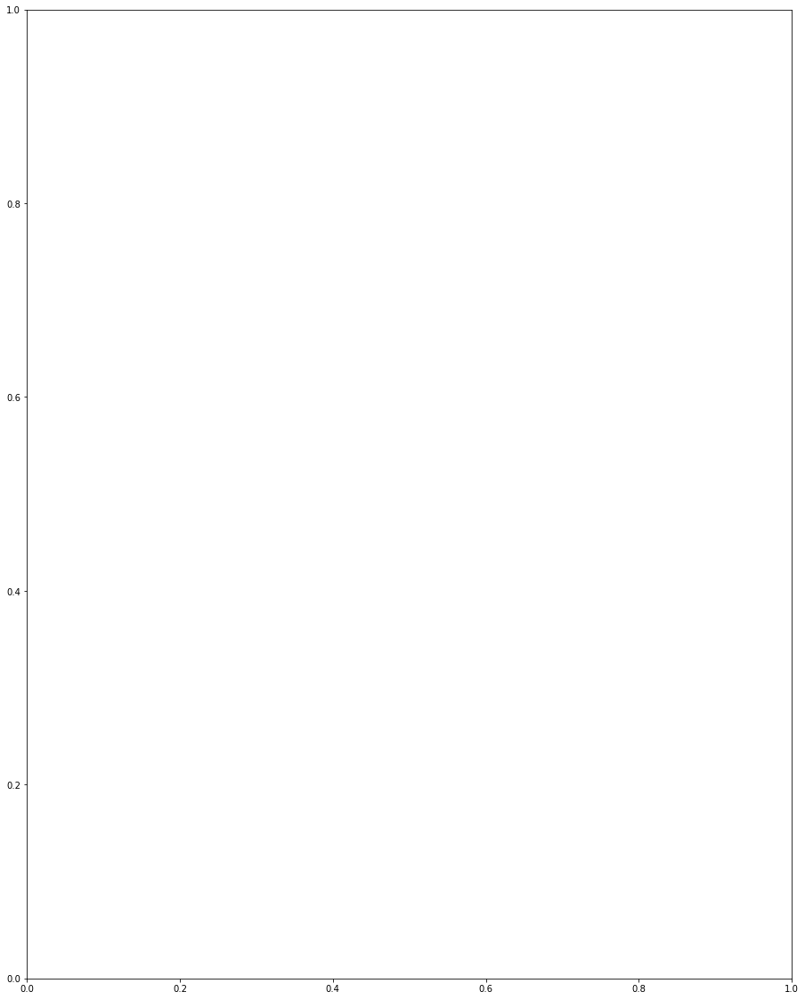

In [65]:
layer2 = red.plot(figsize=(20,20),
                  column='holc_grade',
                  legend=True,
#                   palette={'A':'#ffffff','B':'#aaffff','C':'#ffffff','D':'#aaffff'}
                 )

In [13]:
# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

In [14]:
# set the mapbox access token
token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'
px.set_mapbox_access_token(token)

In [15]:
# what's the centroid?
minx, miny, maxx, maxy = red.geometry.total_bounds
center_lat_red = (maxy-miny)/2+miny
center_lon_red = (maxx-minx)/2+minx

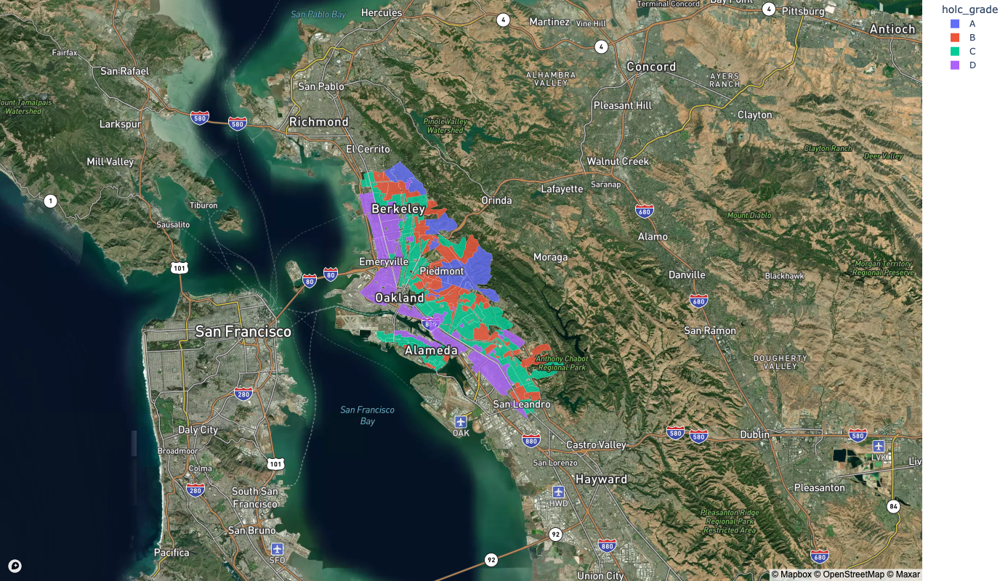

In [16]:
fig = px.choropleth_mapbox(red, 
                     geojson=red.geometry, # the geometry column
                     locations=red.index, # the index
                     mapbox_style="satellite-streets",
                     zoom=10, 
                     color='holc_grade',
#                      color_continuous_scale='RdYlGn_r',
#                      color_continuous_midpoint =median, # put the median as the midpoint
#                      range_color =(0,median*2),
                     hover_data=['holc_grade'],
                     center = {"lat": center_lat_red, "lon": center_lon_red},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     )
fig.update_traces(marker_line_width=0.1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [17]:
cal = cal.to_crs(4326)

In [18]:
cal.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 8035 entries, 0 to 8034
Data columns (total 67 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Tract       8035 non-null   float64 
 1   ZIP         8035 non-null   int64   
 2   County      8035 non-null   object  
 3   ApproxLoc   8035 non-null   object  
 4   TotPop19    8035 non-null   int64   
 5   CIscore     8035 non-null   float64 
 6   CIscoreP    8035 non-null   float64 
 7   Ozone       8035 non-null   float64 
 8   OzoneP      8035 non-null   float64 
 9   PM2_5       8035 non-null   float64 
 10  PM2_5_P     8035 non-null   float64 
 11  DieselPM    8035 non-null   float64 
 12  DieselPM_P  8035 non-null   float64 
 13  Pesticide   8035 non-null   float64 
 14  PesticideP  8035 non-null   float64 
 15  Tox_Rel     8035 non-null   float64 
 16  Tox_Rel_P   8035 non-null   float64 
 17  Traffic     8035 non-null   float64 
 18  TrafficP    8035 non-null   float64 
 19

<AxesSubplot:>

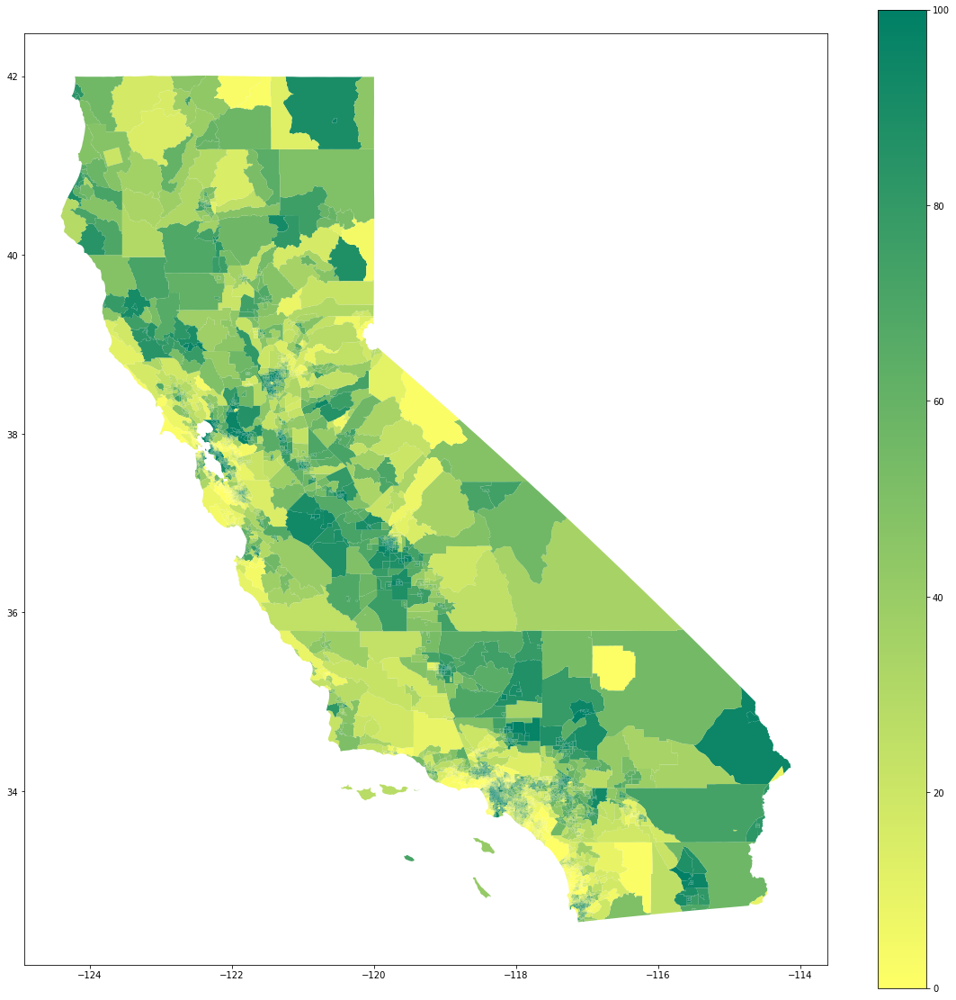

In [19]:
cal.plot(figsize=(20,20), column='AsthmaP',vmin=0, vmax=100, legend=True, cmap='summer_r')

In [20]:
cal.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [21]:
# get the bounding box coordinates for the arrest data
minx, miny, maxx, maxy = red.geometry.total_bounds
print(minx)
print(maxx)
print(miny)
print(maxy)

-122.309701
-122.116847
37.713694
37.906012


/opt/conda/lib/python3.9/site-packages/geopandas/plotting.py:641: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



(37.713694, 37.906012)

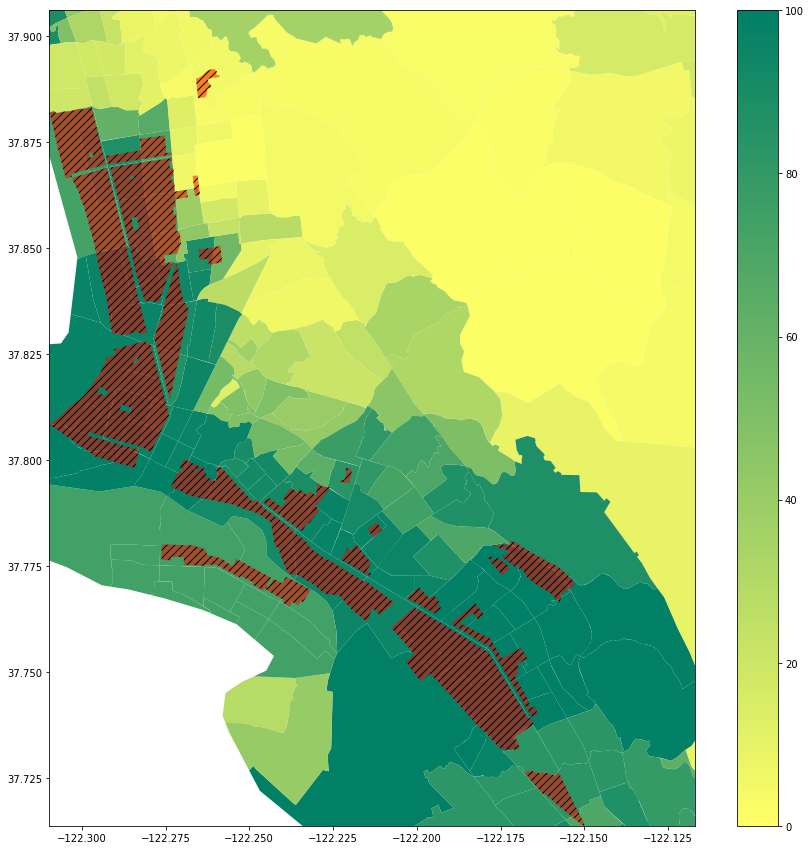

In [22]:
fig, ax = plt.subplots(figsize=(15,15))
cal.plot(ax=ax,figsize=(20,20), column='AsthmaP',vmin=0, vmax=100, legend=True, cmap='summer_r')
red[red['holc_grade']=='D'].plot(ax=ax,column='holc_grade',alpha=0.5,
        linewidth=2,
        hatch="///",
        color='red'
        )
# use the bounding box coordinates to set the x and y limits
ax.set_xlim(minx, maxx) # added/substracted value is to give some margin around total bounds
ax.set_ylim(miny, maxy) # added/substracted value is to give some margin around total bounds


## Green book